In [10]:
import importlib

import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np

import matplotlib.pyplot as plt
from tqdm import tqdm
import os
from sklearn.manifold import TSNE
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import cv2

import clustering.kcenters_greedy

In [3]:
def plot_image_grid(images, labels=None, grid_size=(3, 3), figsize=(3, 3)):
    """
    Plot specific images in a grid.
    
    Parameters:
    images: array of torch images
    labels: optional array of corresponding labels
    grid_size: tuple of (rows, cols)
    figsize: figure size in inches
    """
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    # Flatten axes if grid_size is (1, n) or (n, 1)
    if rows == 1 or cols == 1:
        axes = axes.flatten()
    
    for i, ax in enumerate(axes.flatten()):
        if i < len(images):
            # Display the image
            img = images[i]
            ax.imshow(img, cmap='gray')
            
            # Add label if provided
            if labels is not None:
                ax.set_title(f'Label: {labels[i]}')
            
            # Remove ticks
            ax.set_xticks([])
            ax.set_yticks([])
        else:
            # Hide empty subplots
            ax.axis('off')
    
    plt.tight_layout()
    return fig

In [2]:
if os.path.exists("mnist_dinov2_embeddings.npy"):
    embeddings = np.load("mnist_dinov2_embeddings.npy")
    labels = np.load("mnist_dinov2_labels.npy")
    projections = np.load("mnist_dinov2_projections.npy")

In [4]:
# Download DinoV2 model from torch hub
device = "cuda:0"
dinov2_model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_model.to(device)
dinov2_model.eval()  # Set to evaluation mode

# Prepare MNIST dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # DinoV2 expects 224x224 images
    transforms.Grayscale(3),  # Convert single-channel to 3-channel
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Load MNIST dataset
mnist_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
mnist_loader = torch.utils.data.DataLoader(mnist_dataset, batch_size=64, shuffle=False)

mnist_test = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)
mnist_test_loader = torch.utils.data.DataLoader(mnist_test, batch_size=64, shuffle=False)


Using cache found in /home/lcai/.cache/torch/hub/facebookresearch_dinov2_main
/home/lcai/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/lcai/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/home/lcai/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


In [ ]:
# Extract embeddings
all_embeddings = []
all_labels = []

print("Extracting DINO features...")

with torch.no_grad():
    for images, labels in tqdm(mnist_loader):
        # Extract features using DinoV2
        images, labels = images.to(device), labels.to(device)
        # features = dinov2_model.forward_features(images)['x_norm_patchtokens'].mean(1)
        features = dinov2_model(images)
        
        all_embeddings.append(features.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

# Concatenate embeddings and labels
embeddings = np.concatenate(all_embeddings, axis=0)
labels = np.concatenate(all_labels, axis=0)

print(f"Extracted embeddings shape: {embeddings.shape}")
print(f"Labels shape: {labels.shape}")

# Optional: Save embeddings
np.save('cache/mnist_dinov2_embeddings.npy', embeddings)
np.save('cache/mnist_dinov2_labels.npy', labels)

Extracting DINO features...


100%|██████████| 938/938 [01:51<00:00,  8.38it/s]


Extracted embeddings shape: (60000, 384)
Labels shape: (60000,)


In [6]:
# Extract TSNE projections
tsne = TSNE(n_components=2, random_state=0)
all_features = None
colors = []

projections = tsne.fit_transform(embeddings)
np.save('cache/mnist_dinov2_projections.npy', projections)

In [7]:
fig = px.scatter(
    projections, x=0, y=1,
    color=labels, labels={'color': 'Number'}
)

fig.update_layout(
    width=600,  # Set width and height equal
    height=600,
    yaxis=dict(
        scaleanchor="x",  # This is key - it forces equal scaling
        scaleratio=1,     # Ratio of 1:1
    )
)

fig.show()

In [12]:
# Extract K-centers
K = 10
center_inds, centers = clustering.kcenters_greedy.kcenters_greedy(torch.tensor(embeddings), K, dist_func="norm_l2", init_samples="random", device="cuda:0")
centers_labels = [mnist_dataset[c][1] for c in center_inds]

print("center inds: ", center_inds)
# print("centers: ", centers)
print("labels: ", centers_labels)

center inds:  tensor([27803, 38389, 38262,  7828, 49139,  1852, 35961, 57208,  2583,  8867],
       device='cuda:0')
labels:  [3, 7, 4, 1, 6, 2, 7, 4, 1, 8]


In [13]:
sizes = [40 if i in center_inds else 1 for i in range(len(projections))]
symbols = ["star" if i in center_inds else "circle" for i in range(len(projections))]

fig = px.scatter(
    projections, x=0, y=1,
    color=labels, labels={'color': 'Number'},
    symbol_sequence=symbols,
    size=sizes
)

fig.update_layout(
    width=600,  # Set width and height equal
    height=600,
    yaxis=dict(
        #scaleanchor="x",  # This is key - it forces equal scaling
        scaleratio=1,     # Ratio of 1:1
    ),
)

fig.update_layout(
    title={
        'text': "MNIST-DINO tSNE with K-centers Core-set selection",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()


In [14]:
# Extract K-centers
K = 100
center_inds, centers = clustering.kcenters_greedy.kcenters_greedy(torch.tensor(embeddings), K, dist_func="norm_l2", init_samples="random", device="cuda:0")
centers_labels = [mnist_dataset[c][1] for c in center_inds]

In [15]:
sizes = [40 if i in center_inds else 1 for i in range(len(projections))]
symbols = ["star" if i in center_inds else "circle" for i in range(len(projections))]

fig = px.scatter(
    projections, x=0, y=1,
    color=labels, labels={'color': 'Number'},
    symbol_sequence=symbols,
    size=sizes
)

fig.update_layout(
    width=600,  # Set width and height equal
    height=600,
    yaxis=dict(
        #scaleanchor="x",  # This is key - it forces equal scaling
        scaleratio=1,     # Ratio of 1:1
    ),
)

fig.update_layout(
    title={
        'text': "MNIST-DINO tSNE with K-centers Core-set selection",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

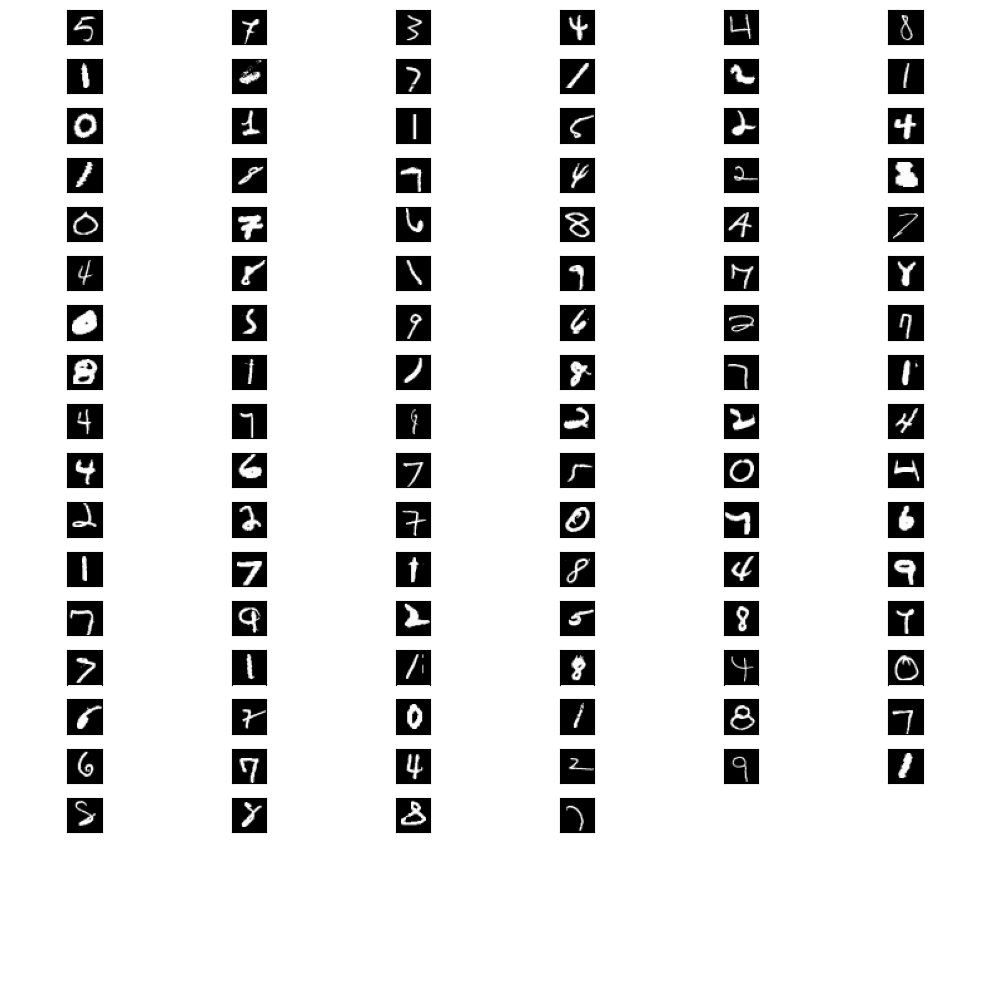

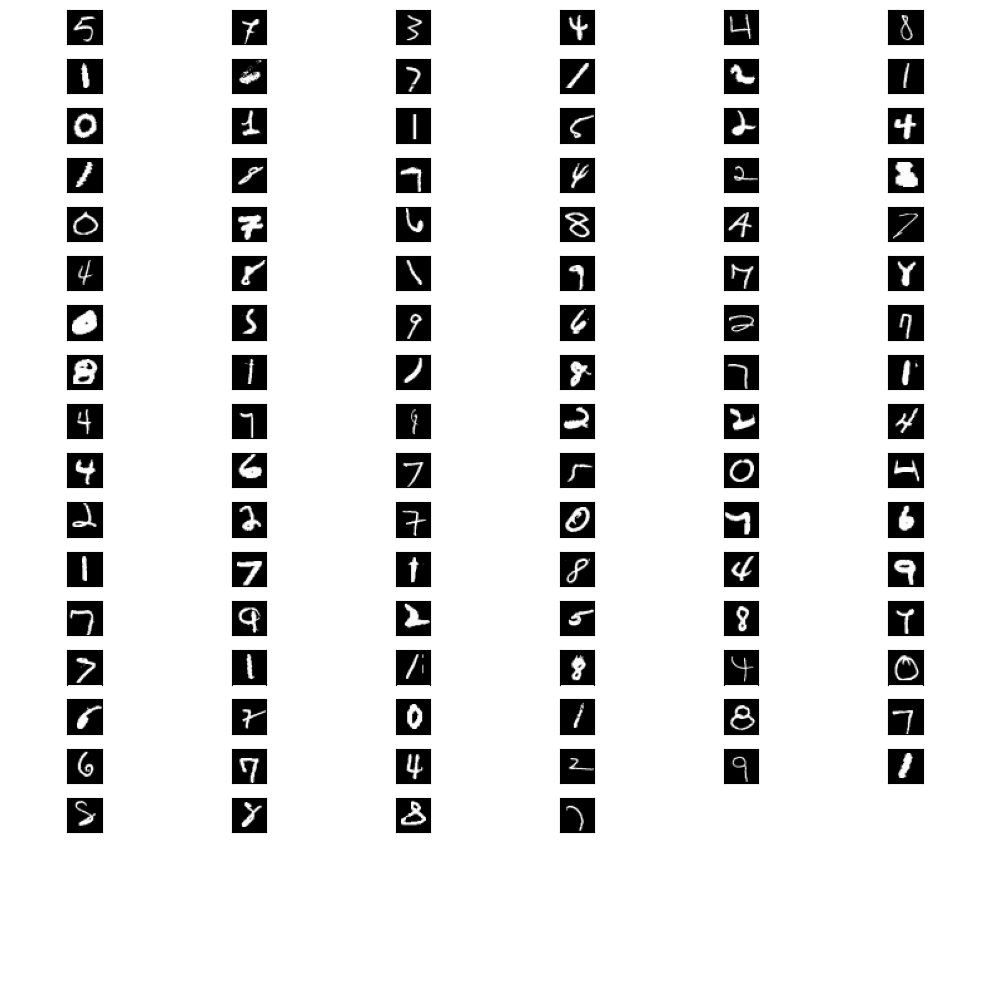

In [105]:
# Plot the representative MNIST core set
plot_size = (28,28)
resize_transform = transforms.Resize(plot_size)  # height, width
transform = transforms.Compose([
    transforms.Grayscale(3),  # Convert single-channel to 3-channel
    transforms.ToTensor(),
])
mnist_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)

imgs = [np.transpose(resize_transform(mnist_dataset[i][0]), (1,2,0)) for i in center_inds]
plot_image_grid(imgs, grid_size=(20, 6), figsize=(10,10))

In [1]:
# Train an MNIST classifier with increasing core-set size
coreset_ratio = [0.1, 0.5, 1.0]

for rt in coreset_ratio:
    pass